In [ ]:
#################
### LIBRERIAS ###
#################

import requests
import xml.etree.ElementTree as ET
import csv
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from scipy.fft import fft
from statsmodels.graphics.tsaplots import plot_acf
from collections import Counter

import warnings


In [ ]:
# Ocultamos los warnings controlados mostrados
warnings.filterwarnings('ignore')

In [ ]:
#################
### FUNCIONES ###
#################

def print_colored(text, color):
    colors = {
        'black': '\033[30m',
        'red': '\033[31m',
        'green': '\033[32m',
        'yellow': '\033[33m',
        'blue': '\033[34m',
        'magenta': '\033[35m',
        'cyan': '\033[36m',
        'white': '\033[37m',
    }

    end_color = '\033[0m'
    color_code = colors.get(color.lower())

    if color_code is None:
        return text
    else:
        return f'{color_code}{text}{end_color}'


def validate_text_extensive(text, threshold):
    # Dividimos el texto en palabras utilizando los espacios en blanco como separadores
    words = text.split()
    return len(words) > threshold

Para desarrollar nuestro proyecto nos centraremos principalmente en 3 pasos:
   - Encontrar los campos de texto extenso de la BBDD de ClinicalTrials.gov.
   - Analizar la evolución de los campos de texto extenso a lo largo del tiempo.
   - Detectar posibles modas o tendencias.

Todo este estudio lo haremos teniendo claro cuál es nuestro objetivo, "**buscar la evolución de los campos de texto extenso y qué tendencias/modas siguen**".

Para poder obtener datos en formato XML sobre los estudios clínicos de cáncer de mama del registro público "ClinicalTrials.gov" emplearemos su API.
Es por ello que nuestra **primera prueba** es realizar una obtención de datos de campos básicos principales en formato XML sobre los estudios clínicos de cáncer de mama del registro público "ClinicalTrials.gov" mediante el empleo de su API (https://clinicaltrials.gov/api/gui).

In [ ]:
##############
### TEST 1 ###
##############

# URL consulta
url_studyFields = 'https://clinicaltrials.gov/api/query/study_fields'
search_term = 'breast+cancer'
fields = ','.join(['NCTId', 'BriefTitle', 'Condition', 'InterventionName'])
output_format = 'XML'
max_results = 100

test1_query_url = f"{url_studyFields}?expr={search_term}&fields={fields}&max_rnk={max_results}&fmt={output_format}"

# Solicitud HTTP GET
test1_response = requests.get(test1_query_url)

# Comprobación...
if test1_response.status_code == 200:
  with open('TEST1_breast_cancer_trials.xml', 'wb') as file:
    file.write(test1_response.content)
  print("Archivo", print_colored('TEST1_breast_cancer_trials.xml', 'green'), "generado con éxito.")
else:
  print("Error al generar archivo XML. Código de estado:", print_colored(test1_response.status_code, 'red'))


Archivo TEST1_breast_cancer_trials.xml generado con éxito.


Tras realizar esta primera prueba, obtenemos como resultado recopilar en un archivo XML  100 resultados de estudios clínicos a partir de la expresión de búsqueda "*breast cancer*", y recogiendo únicamente una serie de campos básicos principales: "*NCTId*", "*BriefTitle*", "*Condition*", "*InterventionName*". El significado de estos campos es:
   - **NCTId** -> identificador único de ClinicalTrials.gov para cada estudio clínico.
   - **BriefTitle** -> título breve y descriptivo del estudio clínico.
   - **Condition** -> enfermedad o condición estudiada en el estudio clínico.
   - **InterventionName** -> nombre de las intervenciones o tratamientos estudiados en el estudio clínico.

Ahora bien, según la documentación de la API sobre el listado de los campos de estudio (https://clinicaltrials.gov/api/info/study_fields_list) hay 328 campos. Para identificar cuáles de estos son campos de texto extenso en los estudios clínicos de la base de datos de *ClinicalTrials.gov* y, por ende, en los que nos vamos a centrar, podemos proceder a buscar cuáles contienen descripciones detalladas, resúmenes o justificaciones.

Centrándonos en esta búsqueda, procedemos a realizar una consulta de obtención de nombre de todos los campos existentes. Y mediante la definición de una serie de palabras clave (*keywords*) recorrer todo este listado de campos proponiendo por cada uno si representa un campo de texto extenso o no.



In [ ]:
##############
### TEST 2 ###
##############

# URL consulta
url_studyFieldsList = "https://clinicaltrials.gov/api/info/study_fields_list"

# Obtención de lista de campos de estudio
resp_studyFieldsList = requests.get(url_studyFieldsList)
root_studyFieldsList = ET.fromstring(resp_studyFieldsList.content)

# Extracción de lista de campos
fieldsList = [field.attrib['Name'] for field in root_studyFieldsList.findall(".//Field")]

# Definición de palabras clave que indican un campo de texto extenso
keywords = ["Description", "Summary", "Criteria", "Text", "Measure", "Explanation", "Justification"]

# Clasificación de campos
study_fields = []
text_extensive_fields = []

for field in fieldsList:
  study_fields.append(field)
  # Si el nombre contiene alguna keyword...
  if any(keyword in field for keyword in keywords):
    text_extensive_fields.append(field)

# Comprobación...
if resp_studyFieldsList.status_code == 200:
  with open('TEST2_StudyFields.txt', 'w') as file:
    for sf in study_fields:
      file.write(f"{sf}\n")
  with open('TEST2_TextExtensiveFields.txt', 'w') as file:
    for tef in text_extensive_fields:
      file.write(f"{tef}\n")
  print("Archivos", print_colored('TEST2_StudyFields.txt', 'green'), "y", print_colored('TEST2_TextExtensiveFields.txt', 'green'),"generados con éxito.")
else:
  print("Error al obtener listado de campos de estudio. Código de estado:", print_colored(resp_studyFieldsList.status_code, 'red'))


Archivos TEST2_StudyFields.txt y TEST2_TextExtensiveFields.txt generados con éxito.


Como resultado, obtenemos los siguientes posibles campos de texto extenso:

In [ ]:
with open('TEST2_TextExtensiveFields.txt', 'r') as file:
  lines_tef = file.readlines()

num_lines_tef = len(lines_tef)
print(print_colored(f"¡Hay {num_lines_tef} posibles campos de texto extenso!",'yellow'))
print("Estos son:")
for num, line in enumerate(lines_tef, 1):
  print(num,"-->",line.strip())


¡Hay 62 posibles campos de texto extenso!
Estos son:
1 --> ArmGroupDescription
2 --> BaselineGroupDescription
3 --> BaselineMeasureCalculatePct
4 --> BaselineMeasureDenomCountGroupId
5 --> BaselineMeasureDenomCountValue
6 --> BaselineMeasureDenomUnits
7 --> BaselineMeasureDenomUnitsSelected
8 --> BaselineMeasureDescription
9 --> BaselineMeasureDispersionType
10 --> BaselineMeasureParamType
11 --> BaselineMeasurePopulationDescription
12 --> BaselineMeasureTitle
13 --> BaselineMeasureUnitOfMeasure
14 --> BaselineMeasurementComment
15 --> BaselineMeasurementGroupId
16 --> BaselineMeasurementLowerLimit
17 --> BaselineMeasurementSpread
18 --> BaselineMeasurementUpperLimit
19 --> BaselineMeasurementValue
20 --> BaselinePopulationDescription
21 --> BioSpecDescription
22 --> BriefSummary
23 --> DesignInterventionModelDescription
24 --> DesignMaskingDescription
25 --> DetailedDescription
26 --> EligibilityCriteria
27 --> EventGroupDescription
28 --> EventsDescription
29 --> FlowGroupDescription

No obstante, para asegurarnos que todos estos campos son campos de texto extenso y no un fallo de nuestra suposición por keywords, procedemos a generar 2 archivos XML de referencia:
   - Un archivo XML (*REF1_TextExtensiveFields.xml*) con todos los campos supuestos como campos de texto extenso y sus correspondientes resultados.
   - Un archivo XML (*REF2_No_TextExtensiveFields.xml*) con el resto de campos y sus correspondientes resultados por si acaso nuestra lista de keywords no fuera correcta y hubiéramos descartado un campo de texto extenso con nombre de campo diferente.

___Nota___: _Cabe recordar que no se puede realizar una consulta a través de la API con todos los campos ya que dará error, la API de *ClinicalTrials.gov* limita la cantidad de campos que se pueden solicitar en una sola consulta a 20. Por tanto, si se desea obtener un número mayor de campos, la opción escogida es dividir la lista de campos deseada en grupos de 20 y realizar varias consultas._

In [ ]:
# Parámetros de la consulta
search_term = "breast+cancer"
max_results = "1"
output_format = "XML"

# Se inicializan las listas para almacenar las respuestas
REF1_responses = []
REF2_responses = []
error = 0

with open('TEST2_TextExtensiveFields.txt', 'r') as file:
  lines_tef = file.readlines()
with open('TEST2_StudyFields.txt', 'r') as file:
  lines_sf = file.readlines()

REF1_fieldsList = [field.strip() for field in lines_tef]
REF2_fieldsList = [field.strip() for field in lines_sf if field not in lines_tef]

# Se divide la lista de campos en grupos de 20...
REF1_chunks = [REF1_fieldsList[i:i + 20] for i in range(0, len(REF1_fieldsList), 20)]
REF2_chunks = [REF2_fieldsList[i:i + 20] for i in range(0, len(REF2_fieldsList), 20)]

### CAMPOS DE TEXTO EXTENSO ###
# Se realiza una consulta para cada grupo de campos
for chunk1 in REF1_chunks:
  REF1_fieldsList_str = ','.join(chunk1)

  # Consulta
  REF1_query_url = f"{url_studyFields}?expr={search_term}&fields={REF1_fieldsList_str}&max_rnk={max_results}&fmt={output_format}"
  REF1_resp = requests.get(REF1_query_url)
  REF1_root = ET.fromstring(REF1_resp.content)

  if REF1_resp.status_code == 200:
    # Se añade respuesta a la lista de respuestas
    REF1_responses.append(REF1_root)
  else:
    error = 1
    print("Motivo Error:", print_colored(REF1_resp.content, 'red'))
    break

try:
    REF1_ALL_response = ET.Element('TextExtensiveFieldsResponse')

    for response in REF1_responses:
      for field in response.findall('.//FieldValues'):
        REF1_ALL_response.append(field)

    with open('REF1_TextExtensiveFields.xml', 'w') as file:
        file.write(ET.tostring(REF1_ALL_response, encoding='unicode'))
    print("Archivo", print_colored('REF1_TextExtensiveFields.xml', 'green'), "generado con éxito.")

except Exception as e:
    print("Error al generar archivo XML. Código de estado:", print_colored(REF1_ALL_response.status_code, 'red'), ". ERROR:", print_colored(e, 'red'))

### RESTO DE CAMPOS ###
for chunk2 in REF2_chunks:
  REF2_fieldsList_str = ','.join(chunk2)

  # Consulta
  REF2_query_url = f"{url_studyFields}?expr={search_term}&fields={REF2_fieldsList_str}&max_rnk={max_results}&fmt={output_format}"
  REF2_resp = requests.get(REF2_query_url)
  REF2_root = ET.fromstring(REF2_resp.content)

  if REF2_resp.status_code == 200:
    # Se añade respuesta a la lista de respuestas
    REF2_responses.append(REF2_root)
  else:
    error = 1
    print("Motivo Error:", print_colored(REF2_resp.content, 'red'))
    break

try:
    REF2_ALL_response = ET.Element('NoTextExtensiveFieldsResponse')

    for response in REF2_responses:
      for field in response.findall('.//FieldValues'):
        REF2_ALL_response.append(field)

    with open('REF2_No_TextExtensiveFields.xml', 'w') as file:
        file.write(ET.tostring(REF2_ALL_response, encoding='unicode'))
    print("Archivo", print_colored('REF2_No_TextExtensiveFields.xml', 'green'),"generado con éxito.")

except Exception as e:
    print("Error al generar archivo XML. Código de estado:", print_colored(REF2_ALL_response.status_code, 'red'), ". ERROR:", print_colored(e, 'red'))


Archivo REF1_TextExtensiveFields.xml generado con éxito.
Archivo REF2_No_TextExtensiveFields.xml generado con éxito.


Abrimos el primero fichero (*REF1_TextExtensiveFields.xml*) y observamos que se compone de 62 campos considerados como campos de texto extenso. No obstante, para asegurarnos que son campos de texto extenso comprobamos sus correspondientes valores si existen en el estudio clínico empleado como referencia.

In [ ]:
REF1_tree = ET.parse('REF1_TextExtensiveFields.xml')
REF1_root = REF1_tree.getroot()

listOK = []
listDude = []

for field_values in REF1_root.iter('FieldValues'):
  field_name = field_values.get('Field')
  field_value_element = field_values.find('FieldValue')

  if field_value_element is not None:
    field_value = field_value_element.text
    print("Campo", print_colored(field_name, 'green'),"tiene valor: \n",print_colored(field_value, 'blue'))
    if validate_text_extensive(field_value, 10):
      listOK.append(field_name)
      print(print_colored('[OK]','green'), "¡Es campo de texto extenso!")
      print("---------------------------------------------------")
    else:
      listDude.append(field_name)
      print(print_colored('[DUDA]','yellow'), "¡Puede no ser campo de texto extenso!")
      print("---------------------------------------------------")
  else:
    listDude.append(field_name)
    print(print_colored('[DUDA]','yellow'), "Campo",print_colored(field_name, 'red'),"no tiene valor.")
    print("---------------------------------------------------")


Campo ArmGroupDescription tiene valor: 
 Female patients diagnosed with hormone receptor-positive (HR+), lymph node-negative (LN-) or lymph node-positive (LN+, with 1-3 positive nodes) early-stage invasive breast cancer, who are distant recurrence-free.
[OK] ¡Es campo de texto extenso!
---------------------------------------------------
[DUDA] Campo BaselineGroupDescription no tiene valor.
---------------------------------------------------
[DUDA] Campo BaselineMeasureCalculatePct no tiene valor.
---------------------------------------------------
[DUDA] Campo BaselineMeasureDenomCountGroupId no tiene valor.
---------------------------------------------------
[DUDA] Campo BaselineMeasureDenomCountValue no tiene valor.
---------------------------------------------------
[DUDA] Campo BaselineMeasureDenomUnits no tiene valor.
---------------------------------------------------
[DUDA] Campo BaselineMeasureDenomUnitsSelected no tiene valor.
--------------------------------------------------

En dicha revisión, observamos como muchos campos carecen de valor en el estudio clínico almacenado, por tanto, para estar completamente seguros de que no hay campos falsamente positivos realizamos una consulta de la API de *ClinicalTrials.gov" mediante la query de obtención de todos los posibles valores para un campo concreto indicado.

In [ ]:
url_fieldValues = "https://clinicaltrials.gov/api/query/field_values"
# Lista de campos falsamente indicados como campo de texto extenso.
listFalse = []
# Contador de reintentos para indicar que un campo es o no campo de texto extenso.
num_retries = 0
# Flag para controlar si un campo tiene algún valor de texto extenso, de ser así se considera campo de texto extenso.
flag_tef = False

for field in listDude:
  flag_tef = False
  show_num_values = 0
  query_url = f"{url_fieldValues}?expr={search_term}&field={field}"
  response = requests.get(query_url)

  if response.status_code == 200:
    # Analizamos la respuesta XML
    root = ET.fromstring(response.content)

    # Obtenemos el número de etiquetas FieldValue
    num_field_values = len(root.findall(".//FieldValue"))
    print("Campo:",print_colored(field, 'yellow'),"--- Valores únicos:",print_colored(num_field_values, 'yellow'))
    print("Estos valores son:")

    field_value_list = root.find(".//FieldValueList")
    if field_value_list is not None:
      for field_value in field_value_list:
        if not validate_text_extensive(field_value.text, 10) and not flag_tef:
          num_retries += 1
          if num_retries == num_field_values:
            num_retries = 0
            print(field_value.text)
            listFalse.append(field)
            print(print_colored("¡NO ES CAMPO DE TEXTO EXTENSO! Descartamos...", 'red'))
            break

        else:
          flag_tef = True
          if show_num_values == 3:
            show_num_values = 0
            break
          show_num_values += 1

          if field not in listOK:
            listOK.append(field)
          print(print_colored(f"[VALOR {show_num_values}]", 'blue'),"-->",field_value.text)
    else:
      listFalse.append(field)
      print(print_colored("No hay valores. Descartamos...", 'red'))

    print("----------------------------------------")
  else:
    print("Error al realizar la consulta para el campo",print_colored(field, 'red'))



Campo: BaselineGroupDescription --- Valores únicos: 4043
Estos valores son:
[VALOR 1] --> (2) 18F-FFNP-PET/CT scans

First one prior to estradiol challenge test
Second one immediately following one day of estradiol challenge test
(1) FDG-PET/CT scan at screening
The estradiol challenge test will consist of administering a total of 6 mg of estradiol dosed orally as three 2 mg tablets with each tablet being administered approximately 8 hours apart and within a 24 hour period. This estradiol medication will be provided to the patient by the study.
[VALOR 2] --> (4 days on/3 days off) with Paclitaxel 90 mg/m2 once weekly
[VALOR 3] --> (closed 11/10/10) Patients receive doxorubicin IV and cyclophosphamide IV on day 1 and pegfilgrastim subcutaneously (SC) on day 2 or filgrastim (G-CSF) SC on days 3-10. Treatment repeats every 14 days for 6 courses. Beginning 2 weeks after completion of doxorubicin and cyclophosphamide, patients receive paclitaxel IV over 3 hours on day 1 and pegfilgrastim SC

Trsa esto, obtenemos de forma correcta y calculada qué campos de los estimados por *keywords* son realmente "**campos de texto extenso**" y cuáles han sido falsamente estimados. Un resumen de este resultado es:

In [ ]:
print(print_colored("### ESTADÍSTICAS ###", 'yellow'))
print("Campos totales:", len(fieldsList))
print("Campos estimados como campos de texto extenso:", num_lines_tef)
print("Campos falsamente estimados:", len(listFalse))
print(print_colored('[OBJETIVO]', 'green'),"Campos de texto extenso:", len(listOK))

### ESTADÍSTICAS ###
Campos totales: 328
Campos estimados como campos de texto extenso: 62
Campos falsamente estimados: 27
[OBJETIVO] Campos de texto extenso: 35


Una vez obtenido los campos de estudio de texto extenso, podemos proceder a analizar y extraer el contenido de estos campos.

Primeramente, como podemos observar tenemos 35 campos a analizar su evolución, pero únicamente se pueden realizar consultas de máximo 20 campos. Por tanto, procedemos a separar el listado de campos de texto extenso en dos partes (*PART1_* y *PART2_*):

In [ ]:
text_fields_list = listOK
PART1_text_fields_list = listOK[:17]
PART2_text_fields_list = listOK[17:]

Tras dicha división, el siguiente paso es obtener toda la información de estos campos ordenada de forma ascendente a lo largo del tiempo para poder estudiar y analizar su correspondiente evolución. Para ello, aparte de emplear los campos de texto extenso haremos uso de 2 campos más:
   - **NCTId** (Identificador único del estudio clínico)
   - **StatusVerifiedDate** (Fecha de verificación del registro)

En este punto, debemos comentar la elección del campo **StatusVerifiedDate** para organizar los valores de los campos de texto extenso a lo largo del tiempo. A principio, escogimos 4 posibles campos de fecha (*StatusVerifiedDate*,*StartDate*,*PrimaryCompletionDate*,*CompletionDate*). De estos 4 campos, pensamos que el más idóneo es *StatusVerifiedDate*, ya que como se indica en la API dicho campo refleja la fecha en la que la parte responsable verificó por última vez la información del estudio clínico en el registro completo de ClinicalTrials.gov para el estudio clínico incluso si no se envía información adicional o actualizada (https://prsinfo.clinicaltrials.gov/definitions.html#VerificationDate), y por ende, pensamos que al indicar la última vez que se verificó la información contenida es la mejor fecha posible para organizar todos los valores de los campos a lo largo del tiempo, así podremos observar sus correspondientes evoluciones y como han ido cambiando.

Tras comentar la decisión del campo de fecha seleccionado para organizar la evolución de estos campos de texto extenso, el siguiente paso es ordenar toda esta información y almacenar los registros ordenados en un archivo CSV, donde cada campo se almacene en una columna y cada registro en una fila. Para ello, hacemos uso de la biblioteca *csv* de Python para poder escribir los datos en el archivo.

In [ ]:
# Definimos la URL base y los parámetros de búsqueda
base_url = 'https://clinicaltrials.gov/api/query/study_fields'
search_term = 'breast+cancer'
PART1_fields = 'NCTId,' + 'StatusVerifiedDate,' + ','.join(PART1_text_fields_list)
PART2_fields = 'NCTId,' + 'StatusVerifiedDate,' + ','.join(PART2_text_fields_list)
output_format = 'XML'
PART1_min_rnk = 1
PART2_min_rnk = 1
PART1_max_rnk = 100
PART2_max_rnk = 100
# Número máximo de resultados por consulta
max_results = 100

# Realizamos múltiples consultas para obtener un número elevado de registros
PART1_results = []
PART2_results = []

# Bucle de consultas para la primera prte de campos...
while True:
    # URL de la consulta
    PART1_query_url = f'{base_url}?expr={search_term}&fields={PART1_fields}&min_rnk={PART1_min_rnk}&max_rnk={PART1_max_rnk}&fmt={output_format}'

    # Realizamos la consulta a la API
    PART1_response = requests.get(PART1_query_url)

    if PART1_response.status_code == 200:
        # Parseamos el contenido XML de la respuesta
        PART1_root = ET.fromstring(PART1_response.content)

        # Obtenemos los registros de estudio
        PART1_registros = PART1_root.findall('.//StudyFields')
        PART1_results.extend(PART1_registros)

        # Verificamos si hay más resultados
        PART1_more_results = PART1_root.find('.//NStudiesFound').text
        if int(PART1_more_results) > PART1_min_rnk + max_results - 1:
            PART1_min_rnk += max_results
            PART1_max_rnk += max_results
        else:
            break
    else:
        print('Error en la consulta PART1:', PART1_response.content)
        break

# Bucle de consultas para la segunda parte de campos...
while True:
    # URL de la consulta
    PART2_query_url = f'{base_url}?expr={search_term}&fields={PART2_fields}&min_rnk={PART2_min_rnk}&max_rnk={PART2_max_rnk}&fmt={output_format}'

    # realizamos la consulta a la API
    PART2_response = requests.get(PART2_query_url)

    if PART2_response.status_code == 200:
        # Parseamos el contenido XML de la respuesta
        PART2_root = ET.fromstring(PART2_response.content)

        # Obtenemos los registros de estudio
        PART2_registros = PART2_root.findall('.//StudyFields')
        PART2_results.extend(PART2_registros)

        # Verificamos si hay más resultados
        PART2_more_results = PART2_root.find('.//NStudiesFound').text
        if int(PART2_more_results) > PART2_min_rnk + max_results - 1:
            PART2_min_rnk += max_results
            PART2_max_rnk += max_results
        else:
            break
    else:
        print('Error en la consulta PART2:', PART2_response.content)
        break

# Ordenamos los resultados por fecha...
PART1_results_sorted = sorted(PART1_results, key=lambda x: x.find('.//FieldValues[@Field="StatusVerifiedDate"]/FieldValue').text)
PART2_results_sorted = sorted(PART2_results, key=lambda x: x.find('.//FieldValues[@Field="StatusVerifiedDate"]/FieldValue').text)

# Generamos el primer fichero CSV...
with open('PART1_evol_large_text_fields.csv', 'w', newline='', encoding='utf-8') as file:
  writer = csv.writer(file)
  # Encabezado de columnas
  writer.writerow(['NCTId','StatusVerifiedDate'] + PART1_text_fields_list)
  for registro in PART1_results_sorted:
        nctid = registro.find('.//FieldValues[@Field="NCTId"]/FieldValue').text
        status_date = registro.find('.//FieldValues[@Field="StatusVerifiedDate"]/FieldValue').text
        fields_values = [registro.find(f'.//FieldValues[@Field="{f}"]/FieldValue').text if registro.find(f'.//FieldValues[@Field="{f}"]/FieldValue') is not None else '' for f in PART1_text_fields_list]
        writer.writerow([nctid, status_date] + fields_values)

# Generamos el segundo fichero CSV...
with open('PART2_evol_large_text_fields.csv', 'w', newline='', encoding='utf-8') as file:
  writer = csv.writer(file)
  # Encabezado de columnas
  writer.writerow(['NCTId','StatusVerifiedDate'] + PART2_text_fields_list)
  for registro in PART2_results_sorted:
        nctid = registro.find('.//FieldValues[@Field="NCTId"]/FieldValue').text
        status_date = registro.find('.//FieldValues[@Field="StatusVerifiedDate"]/FieldValue').text
        fields_values = [registro.find(f'.//FieldValues[@Field="{f}"]/FieldValue').text if registro.find(f'.//FieldValues[@Field="{f}"]/FieldValue') is not None else '' for f in PART2_text_fields_list]
        writer.writerow([nctid, status_date] + fields_values)



Tras la obtención de nuestros archivos CSV, procedemos a realizar la fusión de ambos basada en sus dos columnas compartidas (*NCTId* y *StatusVerifiedDate*), dando como resultado el archivo CSV completo "**evol_large_text_fields.csv**".

In [ ]:
# Cargamos los dos ficheros CSV
df1 = pd.read_csv('PART1_evol_large_text_fields.csv')
df2 = pd.read_csv('PART2_evol_large_text_fields.csv')

# Realizamos la fusión basada en la columna compartida
merged_df = pd.merge(df1, df2, on=['NCTId', 'StatusVerifiedDate'])

# Guardar el resultado en un nuevo fichero CSV
merged_df.to_csv('evol_large_text_fields.csv', index=False)


¡Perfecto! Ya tenemos los registros ordenados por fecha en un archivo CSV (*evol_large_text_fields.csv*).

In [ ]:
# Cargamos los datos desde el archivo CSV en un DataFrame
df_data = pd.read_csv('evol_large_text_fields.csv')

# Comprobamos el formato de todos los campos
df_data.dtypes


NCTId                                      object
StatusVerifiedDate                         object
ArmGroupDescription                        object
BriefSummary                               object
DetailedDescription                        object
EligibilityCriteria                        object
InterventionDescription                    object
PrimaryOutcomeDescription                  object
PrimaryOutcomeMeasure                      object
SecondaryOutcomeDescription                object
SecondaryOutcomeMeasure                    object
BaselineGroupDescription                   object
BaselineMeasureDescription                 object
BaselineMeasurePopulationDescription       object
BaselineMeasureTitle                       object
BaselineMeasurementComment                 object
BaselinePopulationDescription              object
BioSpecDescription                         object
DesignInterventionModelDescription         object
DesignMaskingDescription                   object


Como vemos, todos los campos son de tipo '*object*' (cadena de texto).

In [ ]:
# Convertimos la columna de fechas al formato adecuado (datetime)
df_data['StatusVerifiedDate'] = pd.to_datetime(df_data['StatusVerifiedDate'])

# Ordenamos los datos por fecha ascendente y sustituimos los valores NaN por vacío
df_sorted = df_data.sort_values(by='StatusVerifiedDate', ascending=True)
#df_sorted.fillna('', inplace=True)

Ya tenemos los datos ordenados por fecha ascendente.

A continuación, dado que todos los campos son de texto extenso, el preprocesamiento y la limpieza de datos se centrarán principalmente en técnicas de procesamiento de lenguaje natural (NLP) para el análisis y la preparación de los datos.

El proceso planteado contiene las siguientes etapas:

   1. **Tokenización**: Se divide el texto en unidades más pequeñas llamadas tokens, que pueden ser palabras individuales o incluso frases más cortas. Esto facilita el procesamiento posterior del texto.

   2. **Eliminación de caracteres especiales y puntuación**: Se remueven los caracteres especiales, como símbolos y puntuaciones, que no aportan significado adicional al análisis.

   3. **Eliminación de palabras vacías (stop words)**: Se eliminan las palabras comunes que no aportan mucho valor semántico, como "a", "el", "y", etc.

   4. **Normalización**: Se aplican técnicas de normalización lingüística, como la lematización, para unificar palabras similares y reducir la variabilidad.

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string

# Descargar recursos adicionales de NLTK
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Definir lista de stopwords
stopwords_list = stopwords.words('english')

# Definir lematizador
lemmatizer = WordNetLemmatizer()

## PROCESAMIENTO DEL TEXTO
def preprocess_text(text):
  # Tokenización de palabras
  tokens = word_tokenize(text.lower())

  # Eliminación de stopwords y signos de puntuación
  tokens = [token for token in tokens if token not in stopwords_list and token not in string.punctuation]

  # Lematización de palabras
  tokens = [lemmatizer.lemmatize(token) for token in tokens]

  # Unir tokens procesados en un solo texto
  processed_text = ' '.join(tokens)

  return processed_text


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
# Aplicar preprocesamiento a cada campo de texto extenso
for column in df_sorted.columns[2:]:
    if df_sorted[column].dtype == 'object':
        df_sorted[column] = df_sorted[column].apply(preprocess_text)


Procedemos a realizar un **análisis exploratorio de los datos (EDA)**, considerando los siguientes pasos:
1.	Conteo de longitud de los textos
2.	Visualización de la distribución de longitud de textos.
3.	Exploración de palabras más frecuentes.
4.	Visualización de nubes de palabras.

Tomamos primero como ejemplo el campo de texto extenso "*BriefSummary*":

In [ ]:
# Calcular la longitud de los textos
df_sorted['BriefSummary'].str.len()

11077     387
1         240
9454      494
9453      831
1409     1277
         ... 
7906      325
7907      255
7908      443
7901      585
7929      387
Name: BriefSummary, Length: 14003, dtype: int64

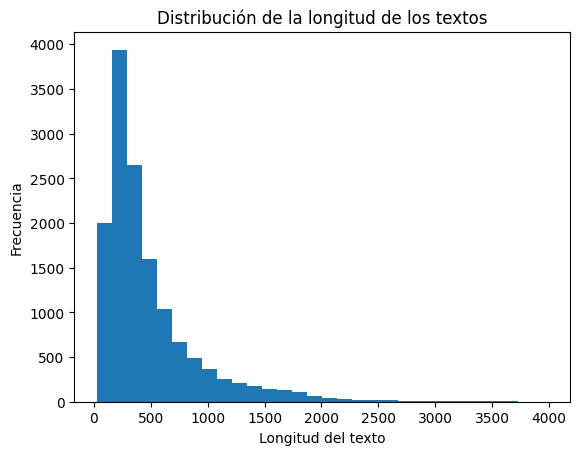

In [ ]:
# Histograma de la longitud de los textos
plt.hist(df_sorted['BriefSummary'].str.len(), bins=30)
plt.xlabel('Longitud del texto')
plt.ylabel('Frecuencia')
plt.title('Distribución de la longitud de los textos')
plt.show()


In [ ]:
# Obtener las palabras más frecuentes
words = ' '.join(df_sorted['BriefSummary']).split()
word_counts = Counter(words)
top_words = word_counts.most_common(10)
print(top_words)


[('cancer', 24609), ('breast', 21233), ('study', 17083), ('patient', 17036), ('treatment', 9263), ('tumor', 6770), ('cell', 5793), ('therapy', 5627), ('chemotherapy', 5260), ('woman', 5195)]


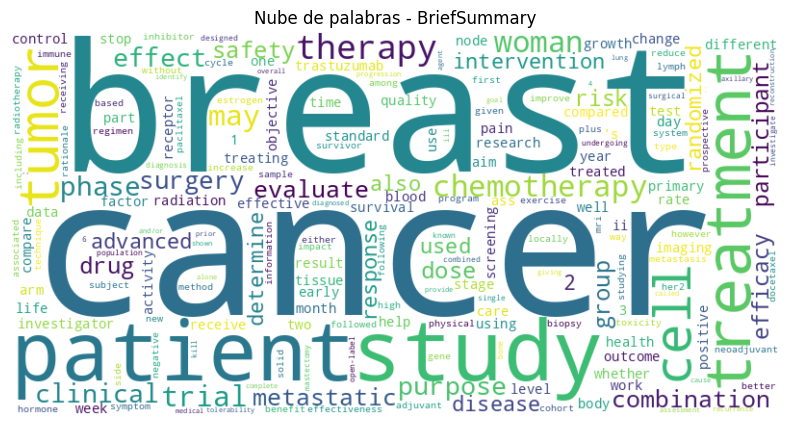

In [ ]:
from wordcloud import WordCloud

# Crear la nube de palabras
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)

# Mostrar la nube de palabras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Nube de palabras - BriefSummary')
plt.show()


Se procede a realizar los mismos pasos pero para todos los campos de texto extenso:

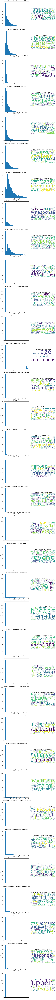

In [ ]:
# Obtener la lista de campos de texto
campos_texto = df_sorted.columns[2:]

# Crear una figura con subplots
fig, axes = plt.subplots(len(campos_texto), 2, figsize=(12, 6*len(campos_texto)))
plt.subplots_adjust(hspace=0.5)  # Ajustar el espaciado vertical entre subplots

# Iterar sobre cada campo de texto
for i, campo in enumerate(campos_texto):
    # Calcular la longitud de los textos
    ax = axes[i, 0]
    ax.hist(df_sorted[campo].str.len(), bins=30)
    ax.set_xlabel('Longitud del texto')
    ax.set_ylabel('Frecuencia')
    ax.set_title('Distribución de la longitud de {}'.format(campo))

    # Obtener las palabras más frecuentes
    words = ' '.join(df_sorted[campo]).split()
    word_counts = Counter(words)
    top_words = word_counts.most_common(10)

    # Crear la nube de palabras
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)

    # Mostrar la nube de palabras
    ax = axes[i, 1]
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title('Nube de palabras de {}'.format(campo))

# Mostrar la figura
plt.tight_layout()

# Guardar la figura en un archivo
if not os.path.exists('EDA'):
    os.makedirs('EDA')
plt.savefig('EDA/EDA_plots.png')

plt.show()


Nuestro siguiente paso es conseguir analizar la evolución de cada campo y encontrar posibles modas o tendencias. Para ello, el proceso de análisis de evolución temporal consta de las siguientes técnicas:

-	**Análisis de frecuencia**.
-	**Análisis de sentimiento**.

El **análisis de frecuencia** es una técnica de NLP que se utiliza para determinar la frecuencia de aparición de palabras o términos en un corpus de texto. Se calcula el recuento de cada palabra y se representa en forma de tabla o gráfico para identificar las palabras más comunes y su frecuencia relativa en el texto.

El **análisis de sentimiento** se centra en determinar la polaridad emocional de un texto, es decir, si el texto transmite sentimientos positivos, negativos o neutrales. Utiliza algoritmos y modelos de NLP para extraer información subjetiva de un texto y clasificarlo en una categoría de sentimiento.


In [ ]:
# Descargamos el recurso "vader_lexicon" requerido y empleado por el analizador de sentimientos Vader en NLTK
nltk.download('vader_lexicon')


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [ ]:
from nltk.probability import FreqDist

frecuencias_dict = {}
sentimientos_dict = {}

def analyze_field(df, field):
    non_null_values = df[field].dropna()

    # Análisis de frecuencia
    frequency_results = []
    for text in non_null_values:
        tokens = word_tokenize(text)
        frequency = FreqDist(tokens)
        frequency_results.append(frequency.most_common(10))

    # Análisis de sentimiento
    sentiment_results = []
    sia = SentimentIntensityAnalyzer()
    for text in non_null_values:
        sentiment = sia.polarity_scores(text)
        sentiment_results.append(sentiment)

    return frequency_results, sentiment_results

# Iterar sobre cada campo de texto
campos_texto_extenso = df_sorted.columns[2:]
for campo in campos_texto_extenso:
    frecuencia, sentimiento = analyze_field(df_sorted,campo)

    frecuencias_dict[campo] = frecuencia
    sentimientos_dict[campo] = sentimiento


Una vez realizado el análisis de frecuencia y el análisis de sentimiento, se procede a visualizar sus resultados a lo largo del tiempo.

Para ello, se generan gráficas de barras para el análisis de frecuencia y gráficas de líneas para el análisis de sentimiento, donde cada campo de texto extenso se representa con una línea diferente en la gráfica.

In [ ]:
fechas=pd.to_datetime(df_sorted['StatusVerifiedDate'])

# Crear gráfica de barras para análisis de frecuencia
def plot_frequency_trends(frecuencias_dict):
    plt.figure(figsize=(10, 6))
    for campo, frecuencias in frecuencias_dict.items():
        x = fechas[:len(frecuencias)]
        y = [frecuencia[0][1] for frecuencia in frecuencias]
        plt.plot(x, y, label=campo)

    plt.xlabel('Tiempo')
    plt.ylabel('Frecuencia')
    plt.title('Análisis de Frecuencia a lo largo del tiempo')
    plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5))
    plt.show()

# Crear gráfica de líneas para análisis de sentimiento
def plot_sentiment_trends(sentimientos_dict):
    plt.figure(figsize=(10, 6))
    for campo, sentimientos in sentimientos_dict.items():
        x = fechas[:len(sentimientos)]
        y = [sentimiento['compound'] for sentimiento in sentimientos]
        plt.plot(x, y, label=campo)

    plt.xlabel('Tiempo')
    plt.ylabel('Sentimiento (Compound Score)')
    plt.title('Análisis de Sentimiento a lo largo del tiempo')
    plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5))
    plt.show()


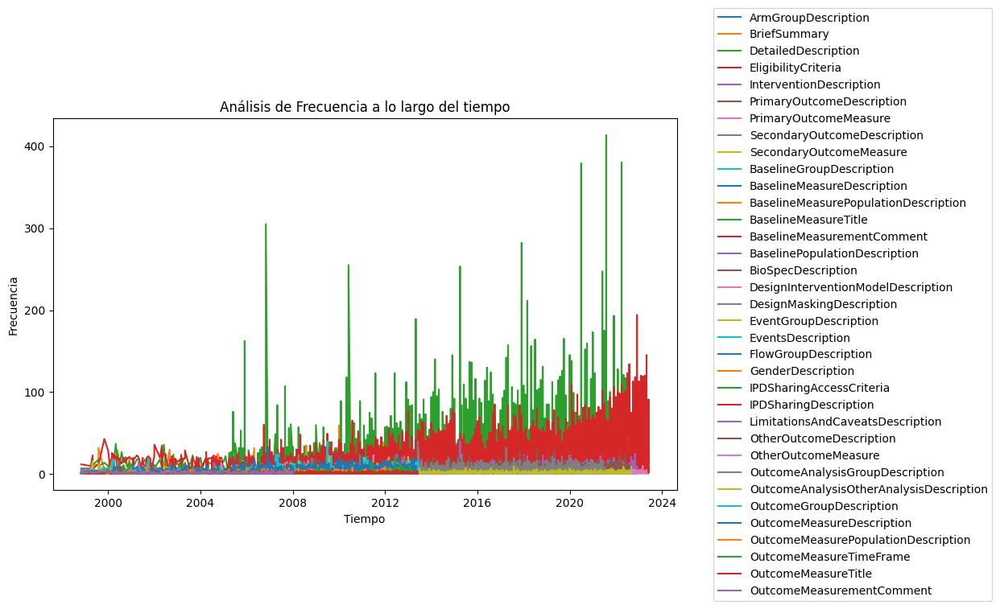

In [ ]:
plot_frequency_trends(frecuencias_dict)

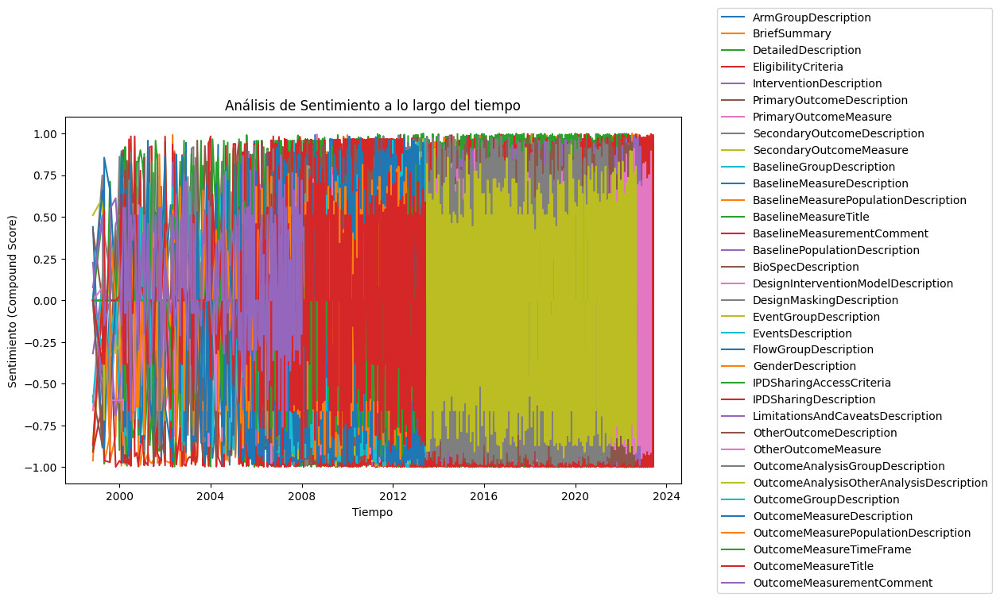

In [ ]:
plot_sentiment_trends(sentimientos_dict)

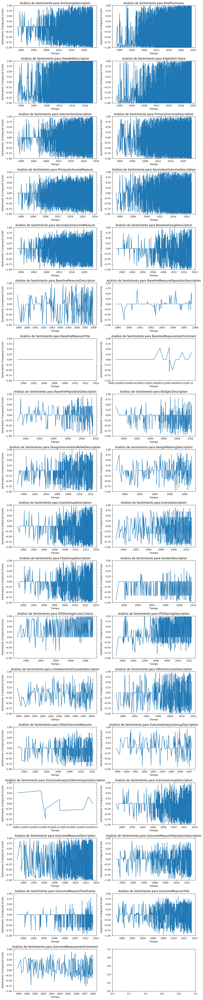

In [ ]:
# Obtener los campos de texto extenso
campos_texto_extenso = list(sentimientos_dict.keys())

# Calcular el número de filas y columnas para los subplots
num_filas = 18
num_columnas = 2

# Calcular el número total de subplots necesarios
num_subplots = num_filas * num_columnas

# Ajustar el tamaño de la figura y los subplots
fig, axes = plt.subplots(nrows=num_filas, ncols=num_columnas, figsize=(12, 60))
fig.subplots_adjust(hspace=0.5)

# Establecer límites fijos para el eje y
y_lim = (-1, 1)

# Iterar sobre los campos y generar las gráficas por campo
for i, campo in enumerate(campos_texto_extenso):
    sentimientos = sentimientos_dict[campo]
    x = fechas[:len(sentimientos)]
    y = [sentimiento['compound'] for sentimiento in sentimientos]

    # Obtener el subplot correspondiente al campo
    ax = axes[i // num_columnas, i % num_columnas]

    # Graficar el sentimiento en el subplot
    ax.plot(x, y, label=campo)
    ax.set_xlabel('Tiempo')
    ax.set_ylabel('Sentimiento (Compound Score)')
    ax.set_title(f'Análisis de Sentimiento para {campo}')

    # Establecer límites fijos para el eje y
    ax.set_ylim(y_lim)

# Ajustar los espacios entre subplots
fig.tight_layout()

# Mostrar la figura
plt.show()


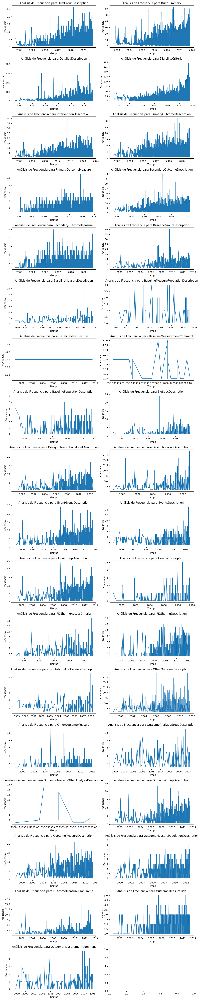

In [ ]:
import matplotlib.pyplot as plt

# Obtener los campos de texto extenso
campos_texto_extenso = list(frecuencias_dict.keys())

# Calcular el número de filas y columnas para los subplots
num_filas = 18
num_columnas = 2

# Calcular el número total de subplots necesarios
num_subplots = num_filas * num_columnas

# Ajustar el tamaño de la figura y los subplots
fig, axes = plt.subplots(nrows=num_filas, ncols=num_columnas, figsize=(12, 60))
fig.subplots_adjust(hspace=0.5)

# Iterar sobre los campos y generar las gráficas por campo
for i, (campo, frecuencias) in enumerate(frecuencias_dict.items()):
    x = fechas[:len(frecuencias)]
    y = [frecuencia[0][1] for frecuencia in frecuencias]

    # Obtener el subplot correspondiente al campo
    ax = axes[i // num_columnas, i % num_columnas]

    # Graficar el sentimiento en el subplot
    ax.plot(x, y, label=campo)
    ax.set_xlabel('Tiempo')
    ax.set_ylabel('Frecuencia')
    ax.set_title(f'Análisis de Frecuencia para {campo}')

# Ajustar los espacios entre subplots
fig.tight_layout()

# Mostrar la figura
plt.show()


In [ ]:
import pandas as pd
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize

# Obtener todas las palabras únicas en el análisis de frecuencia
palabras_unicas = set()

# Análisis de frecuencia y tendencias por campo
tendencias_por_campo = {}

# Iterar sobre cada campo de texto
campos_texto_extenso = ['BaselineMeasurePopulationDescription']

for campo in campos_texto_extenso:
    # Obtener los textos no nulos del campo
    non_null_values = df_sorted[campo].dropna()

    # Análisis de frecuencia
    frequency_results = []
    for text in non_null_values:
        tokens = word_tokenize(text)
        frequency = FreqDist(tokens)
        frequency_results.append(frequency)

        # Agregar palabras únicas al conjunto
        palabras_unicas.update(frequency.keys())

    # Detección de tendencias a lo largo del tiempo
    tendencias_por_campo[campo] = frequency_results


In [ ]:
# Imprimir las palabras más frecuentes y tendencias por campo
for campo, tendencias in tendencias_por_campo.items():
    print("Campo:", campo)
    print("Palabras más frecuentes:")
    for tendencia in tendencias:
        top_words = tendencia.most_common(10)
        print(top_words)
    print("---")

Campo: BaselineMeasurePopulationDescription
Palabras más frecuentes:
[('Race', 1), ('and', 1), ('Ethnicity', 1), ('were', 1), ('not', 1), ('collected', 1), ('from', 1), ('any', 1), ('participant', 1), ('.', 1)]
[('n', 1), ('=', 1), ('24', 1)]
[('Patients', 1), ('that', 1), ('continued', 1), ('with', 1), ('the', 1), ('Optional', 1), ('Flaxseed', 1), ('Continuation', 1), ('Period', 1), ('were', 1)]
[('Part', 2), ('Only', 1), ('overweight/obese', 1), ('participant', 1), ('who', 1), ('completed', 1), ('A', 1), ('were', 1), ('enrolled', 1), ('in', 1)]
[('One', 1), ('subject', 1), ('missing', 1), ('Breast', 1), ('cancer', 1), ('stage', 1), ('information', 1), ('at', 1), ('baseline', 1), ('.', 1)]
[('BMI', 1), ('is', 1), ('missing', 1), ('for', 1), ('1', 1), ('patient', 1), ('allocated', 1), ('to', 1), ('Neulasta®', 1)]
[('not', 2), ('One', 1), ('patient', 1), ('could', 1), ('be', 1), ('included', 1), ('because', 1), ('indication', 1), ('was', 1), ('supplied', 1)]
[('the', 2), ('For', 1), ('2